<a href="https://colab.research.google.com/github/kauefs/AirBnB/blob/%40/SydneyAirBnB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img alt="Colaboratory Logo" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">

#### **Data Science na Prática 4.0**
*by [sigmoidal.ai](https://sigmoidal.ai)*

---


# Análise de Dados do AirBnB: *Sydney*

[![LinkedIn](https://img.shields.io/badge/LinkedIn-kauefs-blue.svg)](https://www.linkedin.com/in/kauefs/) [![GitHub](https://img.shields.io/badge/GitHub-kauefs-black.svg?style=flat)](https://github.com/kauefs/) [![](https://img.shields.io/badge/Python-3-blue.svg)](https://www.python.org/) [![GPLv3 license](https://img.shields.io/badge/License-GPLv3-black.svg)](http://perso.crans.org/besson/LICENSE.html)

<center>13 de julho de 2023</center>

O [AirBnB](https://www.airbnb.com/) é considerado a **maior empresa hoteleira da atualidade**, isso **sem possuir nenhum hotel**! Conectando pessoas que querem viajar (e se hospedar) com anfitriões que querem alugar seus imóveis de maneira prática, fornecendo uma plataforma inovadora para tornar essa hospedagem uma alternativa.

Ao final de 2018, a StartUp, fundada 10 anos atrás, já havia **hospedado mais de 300 milhões** de pessoas ao redor do mundo, desafiando redes hoteleiras tradicionais.

O AirBnB disponibiliza dados para algumas das principais cidades do mundo por meio do portal [Inside Airbnb](http://insideairbnb.com/get-the-data.html), sendo possível baixar grande quantidade de dados para desenvolver projetos & soluções de *Data Science*.

<center><img alt="AirBnB" width="25%" src="https://www.area360.com.au/wp-content/uploads/2017/09/airbnb-logo.jpg"></center>

**Este *NoteBook* analisa dados referentes a Sydney para ver quais insights podem ser extraídos a partir dos dados brutos.**

<p align="center">
  <img alt="Sydney" width="50%" src="https://img.freepik.com/free-vector/skyline-sydney_23-2147769567.jpg">

Image by <a href="https://www.freepik.com/free-vector/skyline-sydney_1842677.htm#query=sydney&position=19&from_view=search&track=sph">Freepik</a></p>

## Obtenção dos Dados

Todos os dados usados foram obtidos a partir do site [Inside AirBnB](http://insideairbnb.com/get-the-data.html).

Esta análise exploratória inicial utilizou apenas o arquivo contendo dados resumidos, fornecido pela própria plataforma**:**

* `listings.csv` - *Summary information and metrics for listings in Sydney (good for visualisations) - datado de 6 de junho de 2023*.

Como o portal é constantemente atualizado, pode ser que, em determinado momento, o [conjunto específico de dados](http://data.insideairbnb.com/australia/nsw/sydney/2023-06-06/visualisations/listings.csv) utilizado neste NoteBook não mais esteja disponível, o que quebraria o código; por isso, cópia dos dados utilizados foram disponibilizadas no [GitHub](https://github.com/kauefs/dsnp/blob/%40/datasets/AirBnB.csv).

In [1]:
# Importando pacotes necessários:
import numpy as np
import pandas as pd

In [2]:
# Importando arquivo listings.csv (dados) para um DataFrame:
dt = "https://github.com/kauefs/AirBnB/raw/%40/dataset/AirBnB-SYD20230606.csv"
df = pd.read_csv(dt)

## Análise dos Dados

Criando consciência situacional inicial para permitir entendimento de como os dados estão estruturados.

### Dicionário de Variáveis

* `id`: número de id único para cada anúncio;
* `name`: nome do anúncio;
* `host_id`: número de id do anfitrião;
* `host_name`: nome do anfitrião;
* `neighbourhood_group`: agrupamento de bairro? Esta coluna não contém valor válido;
* `neighbourhood`: nome do bairro;
* `latitude`: coordenada da latitude da propriedade;
* `longitude`: coordenada da longitude da propriedade;
* `room_type`: informa o tipo de acomodação oferecido;
* `price`: preço pela acomodação;
* `minimum_nights`: quantidade mínima de noites para reservar;
* `number_of_reviews`: número de reviews dados à acomodação;
* `last_review`: data do último review, o mais recente;
* `reviews_per_month`: quantidade de reviews por mês;
* `calculated_host_listings_count`: quantidade de acomodações do mesmo anfitrião;
* `availability_365`: dias disponíveis pelos próximos 365 dias;
* `number_of_reviews_ltm`: quantidade de reviews nos últimos 12 meses (*last twelve months*);
* `license`: pela legislação local, algumas locações específicas de curta temporada requerem licença.

Antes de se iniciar qualquer análise, vamos verificar o *DataSet*, analisando as primeiras entradas.

In [3]:
# Visualizando as primeiras 'df.head()' & últimas 'df.tail()' entradas:
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,4688422,Rental unit in Manly · ★4.71 · 2 bedrooms · 3 ...,13396297,Anne,NaN,Manly,-33.805600,151.284330,Entire home/apt,300,1,36,2023-01-28,0.35,1,31,13,PID-STRA-26284
1,39681254,Rental unit in Manly · ★5.0 · 1 bedroom · 1 be...,25316226,Joel,NaN,Manly,-33.805120,151.289070,Entire home/apt,110,90,3,2019-12-12,0.07,1,0,0,NaN
2,22314790,Rental unit in Manly · 1 bedroom · 2 beds · 1 ...,48897764,Simon,NaN,Manly,-33.796270,151.284760,Entire home/apt,190,90,1,2018-01-06,0.02,1,0,0,NaN
3,39446599,Guesthouse in Eastwood · 1 bedroom · 1 bed · 1...,152329169,Ebrahim,NaN,Ryde,-33.785970,151.092550,Entire home/apt,70,90,0,NaN,NaN,1,0,0,PID-STRA-26166
4,43629106,Rental unit in Manly · ★5.0 · 2 bedrooms · 4 b...,348372472,Jo,NaN,Manly,-33.791103,151.286880,Entire home/apt,742,2,27,2023-03-25,0.85,1,282,10,PID-STRA-10013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23446,906740325185303171,Home in Banksmeadow · ★New · 1 bedroom · 1 bed...,518268746,Cherilynn,NaN,Botany Bay,-33.941845,151.211888,Private room,99,1,0,NaN,NaN,1,364,0,PID-STRA-39654
23447,906761418300415083,Home in Newport · ★New · 4 bedrooms · 4 beds ·...,207225765,Belle Property,NaN,Pittwater,-33.662037,151.319221,Entire home/apt,648,3,0,NaN,NaN,17,128,0,PID-STRA-26235
23448,906778062099543635,Rental unit in Sydney · ★New · 2 bedrooms · 3 ...,343442154,Advante Homes,NaN,Sydney,-33.868030,151.205540,Entire home/apt,657,1,0,NaN,NaN,31,157,0,PID-STRA-11055
23449,906835624973815512,Rental unit in Wentworth Point · ★New · 2 bedr...,474434658,Short Term Accommodation Management,NaN,Auburn,-33.825167,151.078528,Entire home/apt,240,3,0,NaN,NaN,5,0,0,PID-STRA-52734


In [4]:
# Verificando o Index:
df.index

RangeIndex(start=0, stop=23451, step=1)

In [5]:
# Análise de Dados do DataSet:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23451 entries, 0 to 23450
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              23451 non-null  int64  
 1   name                            23451 non-null  object 
 2   host_id                         23451 non-null  int64  
 3   host_name                       23449 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   23451 non-null  object 
 6   latitude                        23451 non-null  float64
 7   longitude                       23451 non-null  float64
 8   room_type                       23451 non-null  object 
 9   price                           23451 non-null  int64  
 10  minimum_nights                  23451 non-null  int64  
 11  number_of_reviews               23451 non-null  int64  
 12  last_review                     

In [6]:
# Resumo Estatístico:
df.describe()

,id,host_id,neighbourhood_group,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,2.345100e+04,2.345100e+04,0.0,23451.000000,23451.000000,23451.000000,23451.000000,23451.000000,17554.000000,23451.000000,23451.000000,23451.000000
mean,2.008396e+17,1.230687e+08,NaN,-33.855606,151.192891,289.477549,48.506759,21.589442,0.954271,11.815658,107.756258,6.202721
std,3.394984e+17,1.339425e+08,NaN,0.083461,0.100280,556.278930,53.000527,50.038387,1.314375,33.929834,127.444825,13.210867
min,1.115600e+04,2.174100e+04,NaN,-34.100680,150.630490,16.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,1.866800e+07,2.150737e+07,NaN,-33.897760,151.159235,99.000000,2.000000,0.000000,0.060000,1.000000,0.000000,0.000000
50%,3.509523e+07,6.175080e+07,NaN,-33.879070,151.212950,170.000000,30.000000,3.000000,0.390000,1.000000,58.000000,0.000000
75%,5.856234e+17,1.857839e+08,NaN,-33.816490,151.261095,299.000000,90.000000,18.000000,1.400000,4.000000,180.000000,6.000000
max,9.075008e+17,5.182687e+08,NaN,-33.383640,151.340410,32133.000000,1125.000000,942.000000,20.030000,229.000000,365.000000,237.000000


## Questões

### **Q1. Quantos atributos (variáveis) e quantas entradas o conjunto de dados possui? Quais os tipos das variáveis?**

Identificar a quantidade de entradas que o conjunto de dados possui e ver os tipos de cada coluna.

**Observação:** o *DataSet* utilizado é a versão resumida disponibilizada pelo AirBnB. Na mesma página do arquivo `listings.csv`, é possível obter a versão mais detalhada - `listings.csv.gz`.

In [7]:
# Identificando o volume de dados do DataFrame:
print('Dimensões do DataSet:',
    '\n Variáveis: ', df.shape[1],
    '\n  Entradas: ', df.shape[0],
    '\n')
# Verificando os tipos de variáveis do DataSet:
df.dtypes

Dimensões do DataSet: 
 Variáveis:  18 
  Entradas:  23451 



id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            object
dtype: object

#### Comentário

Permite uma primeira visão do quantitativo de entradas e variáveis e os tipos desses atributos.

A função `.info()` mostra um quadro informativo mais completo.

### **Q2. Qual a porcentagem de valores ausentes no *DataSet*?**

In [8]:
# Ordem decrescente das variáveis pelo percentual de seus valores ausentes:
(df.isnull().sum()/df.shape[0]).sort_values(ascending=False)

neighbourhood_group               1.000000
license                           0.526630
reviews_per_month                 0.251460
last_review                       0.251460
host_name                         0.000085
minimum_nights                    0.000000
number_of_reviews_ltm             0.000000
availability_365                  0.000000
calculated_host_listings_count    0.000000
number_of_reviews                 0.000000
id                                0.000000
name                              0.000000
room_type                         0.000000
longitude                         0.000000
latitude                          0.000000
neighbourhood                     0.000000
host_id                           0.000000
price                             0.000000
dtype: float64

A qualidade de um *DataSet* está diretamente relacionada à quantidade de valores ausentes nele presentes, sendo importante entender, logo no início, se esses valores são significativos comparados ao total de entradas.

* `neighbourhood_group` possui `100%` de valores ausentes;
* A variável `license` possui mais da metade de valores ausentes;
* As variáveis `reviews_per_month` & `last_review` possuem valores ausentes em mais de um quarto das entradas;
* A variável `host_name` tem apenas `duas` entradas com valores ausentes.

#### Verificando Valores Ausentes

In [9]:
# Necessário identificar a quantidade e sua representatividade frente ao total de entradas:
(df.isnull().sum()).sort_values(ascending=False)

neighbourhood_group               23451
license                           12350
reviews_per_month                  5897
last_review                        5897
host_name                             2
minimum_nights                        0
number_of_reviews_ltm                 0
availability_365                      0
calculated_host_listings_count        0
number_of_reviews                     0
id                                    0
name                                  0
room_type                             0
longitude                             0
latitude                              0
neighbourhood                         0
host_id                               0
price                                 0
dtype: int64

In [10]:
# Verificando percentual de valores ausentes:
(df.isnull().sum()/df.shape[0]).sort_values(ascending=False)

neighbourhood_group               1.000000
license                           0.526630
reviews_per_month                 0.251460
last_review                       0.251460
host_name                         0.000085
minimum_nights                    0.000000
number_of_reviews_ltm             0.000000
availability_365                  0.000000
calculated_host_listings_count    0.000000
number_of_reviews                 0.000000
id                                0.000000
name                              0.000000
room_type                         0.000000
longitude                         0.000000
latitude                          0.000000
neighbourhood                     0.000000
host_id                           0.000000
price                             0.000000
dtype: float64

In [11]:
# Confirmando colunas com valores ausentes:
df.columns[df.isnull().any()].sort_values(ascending=True)

Index(['host_name', 'last_review', 'license', 'neighbourhood_group',
       'reviews_per_month'],
      dtype='object')

In [12]:
# Observa-se que 100% das entradas do 'neighbourhood_group' são vazias,
# o que possibilita sua exclusão, sem prejuízo ao conjunto de dados.
# Verificando Valores Únicos:
df.neighbourhood_group.unique()

array([nan])

In [13]:
df.license.unique()
# Coluna possui mais de 50% de valores ausentes,
# além de não ser informação relevante para a presente análise.

array(['PID-STRA-26284', nan, 'PID-STRA-26166', ..., 'PID-STRA-39654',
       'PID-STRA-11055', 'PID-STRA-52734'], dtype=object)

In [14]:
df.host_name.unique()

array(['Anne', 'Joel', 'Simon', ..., 'Abdu', 'Cherilynn', 'Haihao'],
      dtype=object)

In [15]:
# Verificando Frequencia:
df.license.value_counts(dropna=False)

NaN               12350
Exempt             1799
PID-STRA-27027       34
PID-STRA-49937       22
PID-STRA-38401       13
                  ...  
PID-STRA-7025         1
PID-STRA-3568         1
PID-STRA-42286        1
PID-STRA-6896         1
PID-STRA-52734        1
Name: license, Length: 8492, dtype: int64

In [16]:
df.host_name.value_counts(dropna=False)

MadeComfy                           230
David                               226
Ken                                 181
L'Abode Accommodation Specialist    176
Michael                             156
                                   ... 
Leopoldo                              1
Sophine Muf                           1
Binh                                  1
Cal                                   1
Haihao                                1
Name: host_name, Length: 5475, dtype: int64

In [17]:
# Analisando mais a variável 'host_name':
df.host_name.isnull().values.any()

True

In [18]:
# Visualizando as entradas com valores ausentes para 'host_name':
df.loc[df["host_name"].isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
1967,7903943,Home in Camperdown · 3 bedrooms · 3 beds · 2 b...,19873349,NaN,NaN,Marrickville,-33.89224,151.17846,Entire home/apt,185,90,0,NaN,NaN,1,0,0,NaN
2484,9332896,Home in Roseville Chase · 1 bedroom · 1 bed · ...,32154100,NaN,NaN,Ku-Ring-Gai,-33.77931,151.19558,Private room,44,90,0,NaN,NaN,1,89,0,NaN


In [19]:
# Porcentagem da Frequencia:
df.license.value_counts()/df.shape[0]

Exempt            0.076713
PID-STRA-27027    0.001450
PID-STRA-49937    0.000938
PID-STRA-38401    0.000554
PID-STRA-8541     0.000469
                    ...   
PID-STRA-51478    0.000043
PID-STRA-7025     0.000043
PID-STRA-3568     0.000043
PID-STRA-42286    0.000043
PID-STRA-52734    0.000043
Name: license, Length: 8491, dtype: float64

In [20]:
df.host_name.value_counts()/df.shape[0]

MadeComfy                           0.009808
David                               0.009637
Ken                                 0.007718
L'Abode Accommodation Specialist    0.007505
Michael                             0.006652
                                      ...   
Leopoldo                            0.000043
Sophine Muf                         0.000043
Binh                                0.000043
Cal                                 0.000043
Haihao                              0.000043
Name: host_name, Length: 5474, dtype: float64

#### Tratamento de Dados

In [21]:
# Excluindo colunas com Dados Ausentes e não relevantes para análise:
df_clean = df.drop(columns=["neighbourhood_group", "license"])
# Comparativo Antes & Depois:
print(" Antes:\t{}".format(df.shape))
print("Depois:\t{}".format(df_clean.shape))

 Antes:	(23451, 18)
Depois:	(23451, 16)


In [22]:
# Tratando as únicas duas entradas com valores ausentes em 'host_name':
# Embora a retirada dessas duas entradas seja insignificante,
# a "correção" e a preservação dos dados são fáceis:
df_clean = df_clean.fillna({"host_name": "HOST"})
df_clean.host_name.isnull().values.any()

False

In [23]:
# Visualizando as entradas tratadas:
df_clean.loc[df_clean["host_name"] == "HOST"]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1967,7903943,Home in Camperdown · 3 bedrooms · 3 beds · 2 b...,19873349,HOST,Marrickville,-33.89224,151.17846,Entire home/apt,185,90,0,NaN,NaN,1,0,0
2484,9332896,Home in Roseville Chase · 1 bedroom · 1 bed · ...,32154100,HOST,Ku-Ring-Gai,-33.77931,151.19558,Private room,44,90,0,NaN,NaN,1,89,0


In [24]:
# Confirmando a integridade do DataSet:
df_clean.shape

(23451, 16)

In [25]:
# @title Tratando Valores Ausentes nas Variáveis 'reviews_per_month' & 'last_review':

In [26]:
# Verificando Valores Únicos:
df_clean.reviews_per_month.unique()

array([3.500e-01, 7.000e-02, 2.000e-02,       nan, 8.500e-01, 3.000e-02,
       3.650e+00, 2.280e+00, 6.000e-01, 1.310e+00, 1.190e+00, 3.630e+00,
       1.090e+00, 4.900e-01, 2.560e+00, 7.600e-01, 6.800e-01, 1.210e+00,
       1.280e+00, 1.200e+00, 2.200e-01, 8.800e-01, 1.500e-01, 1.200e-01,
       3.900e-01, 6.500e-01, 1.000e-01, 3.200e-01, 2.570e+00, 1.770e+00,
       2.900e-01, 6.000e-02, 1.000e-02, 2.200e+00, 1.250e+00, 2.320e+00,
       1.680e+00, 1.700e-01, 5.700e-01, 2.300e+00, 2.400e-01, 1.900e-01,
       1.270e+00, 4.000e-02, 5.400e-01, 2.600e-01, 8.000e-02, 1.100e-01,
       1.830e+00, 1.530e+00, 1.400e-01, 1.300e-01, 4.500e-01, 7.800e-01,
       7.200e-01, 6.100e-01, 5.000e-01, 1.600e-01, 2.000e-01, 1.070e+00,
       3.370e+00, 3.510e+00, 3.800e-01, 1.160e+00, 1.840e+00, 2.500e+00,
       1.820e+00, 9.000e-02, 4.800e-01, 1.330e+00, 4.300e-01, 5.000e-02,
       7.900e-01, 4.200e-01, 8.200e-01, 9.900e-01, 2.040e+00, 5.900e-01,
       2.100e-01, 5.300e-01, 1.800e-01, 7.700e-01, 

In [27]:
df_clean.last_review.unique()

array(['2023-01-28', '2019-12-12', '2018-01-06', ..., '2022-09-22',
       '2022-12-12', '2022-11-21'], dtype=object)

In [28]:
# Verificando Frequencia:
df_clean.reviews_per_month.value_counts(dropna=False)

NaN     5897
0.02    1468
0.01     794
0.03     666
0.04     593
        ... 
6.72       1
6.61       1
6.46       1
9.05       1
7.00       1
Name: reviews_per_month, Length: 690, dtype: int64

In [29]:
df_clean.last_review.value_counts(dropna=False)

NaN           5897
2023-06-04     367
2023-05-21     350
2023-05-28     342
2023-05-22     248
              ... 
2015-08-19       1
2022-04-02       1
2017-08-17       1
2015-07-15       1
2016-02-05       1
Name: last_review, Length: 2473, dtype: int64

In [30]:
# Confirmando que são valores nulos:
df_clean.reviews_per_month.isnull().values.any()

True

In [31]:
# Também de fácil correção sem perda de entradas,
# substituindo valores nulos por (0) zero em ambas as variáveis:
df_clean = df_clean.fillna({"reviews_per_month": 0})
df_clean.reviews_per_month.isnull().values.any()

False

In [32]:
# Confirmando correção:
df_clean.reviews_per_month.value_counts(dropna=False)

0.00    5897
0.02    1468
0.01     794
0.03     666
0.04     593
        ... 
6.72       1
6.61       1
6.46       1
9.05       1
7.00       1
Name: reviews_per_month, Length: 690, dtype: int64

In [33]:
# Confirmando a integridade do DataSet:
df_clean.shape

(23451, 16)

In [34]:
# Utilizando a última entrada como exemplo para 'last_review':
df_clean.iloc[23450:23451]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
23450,907077619932231671,Home in Millers Point · ★New · 2 bedrooms · 2 ...,510052112,Haihao,Sydney,-33.87567,151.20462,Entire home/apt,199,1,0,NaN,0.0,1,148,0


In [35]:
# Confirmando presença de valores ausentes:
df_clean.last_review.isnull().values.any()

True

In [36]:
# Preenchendo valores ausentes com 0 (zero) e confirmando resultado:
df_clean = df_clean.fillna({"last_review": 0})
df_clean.reviews_per_month.isnull().values.any()

False

In [37]:
# Confirmando correção:
df_clean.iloc[23449:23451]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
23449,906835624973815512,Rental unit in Wentworth Point · ★New · 2 bedr...,474434658,Short Term Accommodation Management,Auburn,-33.825167,151.078528,Entire home/apt,240,3,0,0,0.0,5,0,0
23450,907077619932231671,Home in Millers Point · ★New · 2 bedrooms · 2 ...,510052112,Haihao,Sydney,-33.875670,151.204620,Entire home/apt,199,1,0,0,0.0,1,148,0


In [38]:
# Confirmando a integridade do DataSet:
df_clean.shape

(23451, 16)

In [39]:
# Nova contagem de valores ausentes:
(df_clean.isnull().sum()).sort_values(ascending=False)

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
dtype: int64

#### Análise Preliminar

Todos os dados ausentes foram tratados. O conjunto de dados permitiu que todas as entradas fossem mantidas sem prejuízo da informação. Duas variáveis, uma com 100% e a outra com mais de 50% de dados ausentes, e que não apresentavam relevância para o escopo da análise, foram suprimidas, enxugando o conjunto de dados.

Variáveis `reviews_per_month` & `last_review` possuíam a mesma quantidade de valores ausentes, indicando, provavelmente, variáveis que entraram posteriormente no conjunto de dados.

Melhores *insights* poderão advir após análise gráfica.

### **Q3. Qual é a distribuição das variáveis?**

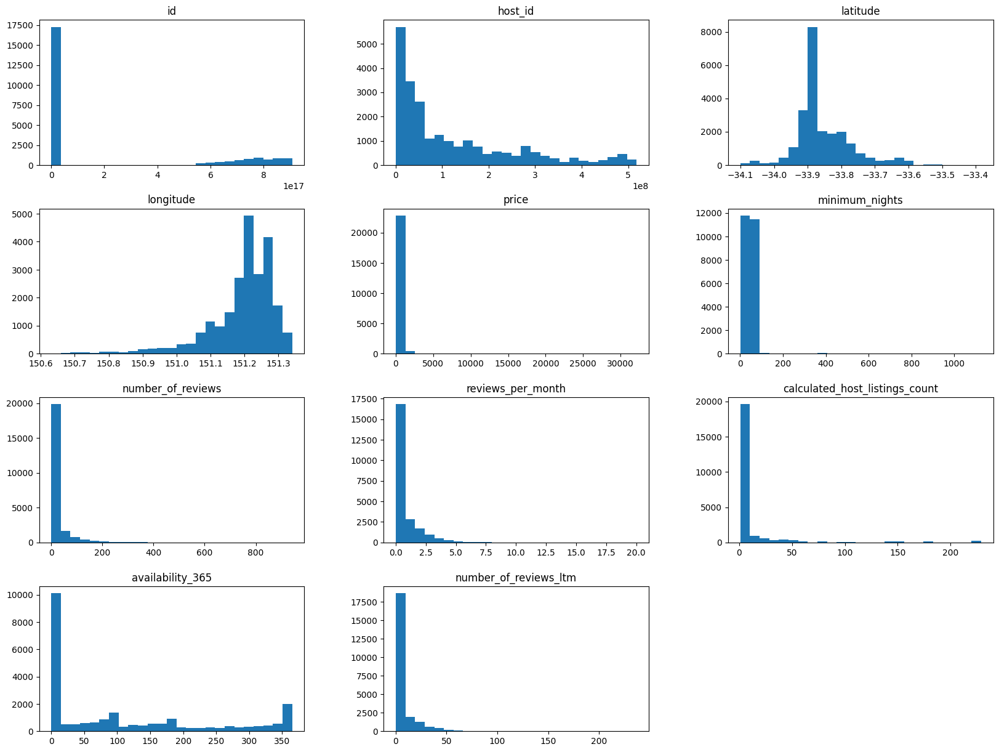

In [40]:
# HistoGrama das variáveis numéricas:
# (trabalhando com os dados já tratados)
# Importando pacotes necessários:
import matplotlib.pyplot as plt
df_clean.hist(bins=25, figsize=(20,15), grid=False);

Pela distribuição dos HistoGramas, é possível verificar indícios da presença de *OutLiers* nas variáveis `price`, `minimum_nights`, `number_of_reviews`, `reviews_per_month`, `calculated_host_listings_count` e `number_of_reviews_ltm`.

Os valores não seguem uma distruição uniforme, distorcendo a representação gráfica. Para confirmar, há duas maneiras rápidas que auxiliam a detecção de *OutLiers*:

* Resumo Estatístico - `describe()`;
* `BoxPlots` para as variáveis.

#### Limpeza de Dados

* Definir Q1 & Q3 para variáveis que serão limpas;
* Calcular IQR;
* Definir limites superior & inferior para cortar *OutLiers*;
* Remover *OutLiers*.

In [41]:
# Resumo estatístico das variáveis numéricas:
df_clean[['price',
          'minimum_nights',
          'number_of_reviews',
          'reviews_per_month',
          'calculated_host_listings_count',
          'availability_365',
          'number_of_reviews_ltm']].describe().round(2)

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,23451.00,23451.00,23451.00,23451.00,23451.00,23451.00,23451.00
mean,289.48,48.51,21.59,0.71,11.82,107.76,6.20
std,556.28,53.00,50.04,1.21,33.93,127.44,13.21
min,16.00,1.00,0.00,0.00,1.00,0.00,0.00
25%,99.00,2.00,0.00,0.00,1.00,0.00,0.00
50%,170.00,30.00,3.00,0.12,1.00,58.00,0.00
75%,299.00,90.00,18.00,1.00,4.00,180.00,6.00
max,32133.00,1125.00,942.00,20.03,229.00,365.00,237.00


A partir do resumo estatístico acima, pode-se fazer algumas inferências:

* A variável `price` possui 75% de valor abaixo de 300, entretanto seu valor máximo é acima de 30 mil;
* Há quantidade mínima de noites (`minimum_nights`) acima de 365 dias;
* 75% das acomodações tem menos de 20 *reviews* (`number_of_reviews`), porém há valor máximo de quase mil *reviews* para uma única listagem;
* Média & Mediana são de menos de um *review* por mês (`reviews_per_month`), contudo há valor máximo em 20 - lembrando, todavia, que esta variável tinha mais de um quarto de suas entradas com valores nulos;
* Elevado desvio-padrão na quantidade de acomodações listadas para um mesmo host (`calculated_host_listings_count`), com 75% deles possuindo até no máximo 4 listagens, no entanto, apresentando uma média de quase 12 e máximo em 229 - em todo caso, não é uma variável relevante para esta análise;
* Quando a disponibilidade de acomodação para os próximos 365 dias (`availability_365`), observa-se que a mediana está em 58 e a média em mais de 100, com pelo menos 25% das acomodações não estando disponíveis, o que poderia representar acomodações muito demandadas ou bloqueio pelos anfitriões;
* O resumo estatístico da quantidade de reviews nos últimos 12 meses (`number_of_reviews_ltm`) chama atenção, com 75% das entradas listadas possuindo apenas 6 reviews nos últimos 12 meses, mas com um valor máximo muito destoante.

Grandes variações & elevado desvio-padrão denotam a existência de *OutLiers* no *DataSet*.

In [42]:
# Identificando OutLiers para a variável 'price':
Q1_price = df_clean.price.quantile(.25)
Q3_price = df_clean.price.quantile(.75)
IQR_price = Q3_price - Q1_price
print('IQR do Preço: ', IQR_price)
# Definindo Limites:
Superior_Price = Q3_price + 1.5 * IQR_price
Inferior_Price = Q1_price - 1.5 * IQR_price
print('Limite Superior de Preço: ', Superior_Price)
print('Limite Inferior de Preço: ', Inferior_Price)

IQR do Preço:  200.0
Limite Superior de Preço:  599.0
Limite Inferior de Preço:  -201.0


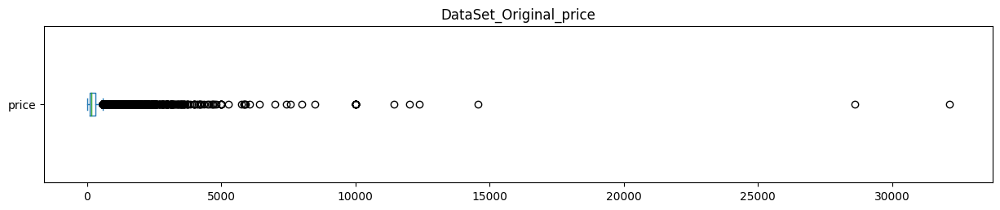

O DataSet possui 23451 colunas
com 2100 entradas acima de 600.00,
representando 8.95% do DataSet.


In [43]:
# BoxPlot visualizando o conjunto original:
fig, ax = plt.subplots(figsize=(15,2.5))
df.price.plot(kind='box', vert=False);
ax.set_title('DataSet_Original_price')
plt.show()
print("O DataSet possui {} colunas".format(df.shape[0]))
print("com {} entradas acima de 600.00,"
    .format(len(df[df.price > 600.00])))
print("representando {:.2f}% do DataSet."
    .format((len(df[df.price > 600.00])/df.shape[0])*100))

In [44]:
# Identificando OutLiers para a variável 'minimum_nights':
Q1minN = df_clean.minimum_nights.quantile(.25)
Q3minN = df_clean.minimum_nights.quantile(.75)
IQRminN = Q3minN - Q1minN
print('IQR de Noites Mínimas: ', IQRminN)
# Definindo Limites:
SupMinN = Q3minN + 1.5 * IQRminN
InfMinN = Q1minN - 1.5 * IQRminN
print('Limite Superior de Noites: ', SupMinN)
print('Limite Inferior de Noites: ', InfMinN)

IQR de Noites Mínimas:  88.0
Limite Superior de Noites:  222.0
Limite Inferior de Noites:  -130.0


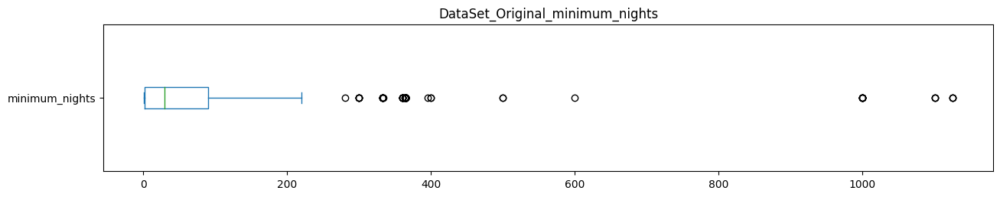

O DataSet possui 23451 colunas
com 94 entradas acima de 210 noites mínimas,
representando 0.40% do DataSet.


In [45]:
# Visualizando o conjunto original:
fig, ax = plt.subplots(figsize=(15,2.5))
df.minimum_nights.plot(kind='box', vert=False);
ax.set_title('DataSet_Original_minimum_nights')
plt.show()
print("O DataSet possui {} colunas"
    .format(df.shape[0]))
print("com {} entradas acima de 210 noites mínimas,"
    .format(len(df[df.minimum_nights > 210])))
print("representando {:.2f}% do DataSet."
    .format((len(df[df.minimum_nights > 210])/df.shape[0])*100))

In [46]:
# Identificando OutLiers para a variável 'number_of_reviews':
Q1nr = df_clean.number_of_reviews.quantile(.25)
Q3nr = df_clean.number_of_reviews.quantile(.75)
IQRnr = Q3nr - Q1nr
print('IQR de Reviews: ', IQRnr)
# Definindo Limites:
SupMinNR = Q3nr + 1.5 * IQRnr
InfMinNR = Q1nr - 1.5 * IQRnr
print('Limite Superior de Reviews: ', SupMinNR)
print('Limite Inferior de Reviews: ', InfMinNR)

IQR de Reviews:  18.0
Limite Superior de Reviews:  45.0
Limite Inferior de Reviews:  -27.0


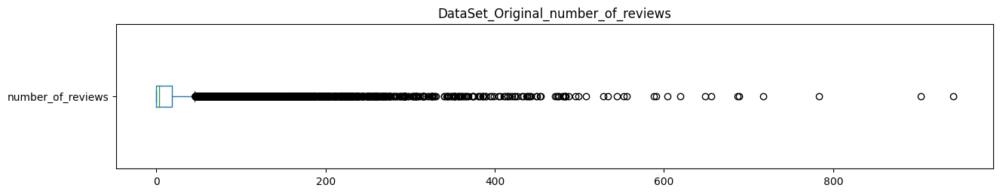

O DataSet possui 23451 colunas
com 3083 entradas acima de 45 reviews,
representando 13.15% do DataSet.


In [47]:
# Visualizando o conjunto original:
fig, ax = plt.subplots(figsize=(15,2.5))
df.number_of_reviews.plot(kind='box', vert=False);
ax.set_title('DataSet_Original_number_of_reviews')
plt.show()
print("O DataSet possui {} colunas"
    .format(df.shape[0]))
print("com {} entradas acima de 45 reviews,"
    .format(len(df[df.number_of_reviews > 45])))
print("representando {:.2f}% do DataSet."
    .format((len(df[df.number_of_reviews > 45])/df.shape[0])*100))

#### Definindo o Problema

Analisando melhor o conjunto de variáveis em seu contexto, principalmente após o levantamento de alguns IQR (*InterQuartile Range*), e considerando o conjunto de dados, entende-se que o escopo da análise deva ser o ponto de vista de alguém em busca de acomodação em Sydney.

Assim, para além da métrica puramente quantitativa adotada, entende-se ser interessante algumas inferências qualitativas, evidentemente, baseadas no levantamento quantitativo realizado: Resumo Estatístico, IQR e Limites Superiores, no caso, já que o problema com os dados é que eles estão justamente muito à esquerda no HistoGrama, ou seja, mais para o lado dos limites inferiores, cujos cálculos resultaram em valores negativos, o que, dado o objeto de trabalho (acomodação), não faz sentido; portanto, os limites inferiores não são interessantes para esta análise em específico.

Partindo dessas premissas, é possível estabelecer melhor o escopo do estudo. Dessa forma, pode-se desconsiderar da análise a quantidade de acomodações (ou propriedades) por anfitrião (`calculated_host_listings_count`), pois não seria de interesse, ao menos em um primeiro momento, dada a abordagem desta análise. Ademais, a quantidade de reviews mensal (`reviews_per_month`) é uma dado que depender muito da quantidade de noites para as quais uma acomodação é reservada, bem como do cliente se lembrar de fazer o review e se foi feito dentro do mês ou posteriormente, de forma que, ao menos inicialmente, é mais uma variável a ser deixada de lado; sem contar que foi uma das variáveis tratadas, sendo que mais de 25% de suas entradas eram inválidas, talvez por ter sido introduzida posteriormente na série. Já a quantidade de reviews nos últimos 12 meses (`number_of_reviews_ltm`) também apresenta métricas destoantes, podendo, eventualmente, ser utilizada em uma etapa mais aprofundada de análise.

Logo, para permitir uma primeira análise, focar-se-á no preço (`price`), no mínimo de noites (`minimum_nights`) para se efetuar uma reserva e no número total de reviews (`number_of_reviews`).

Quanto ao preço (`price`), o Resumo Estatístico mostra que 75% dos valores estão abaixo de 300.00, com uma média abaixo de 290.00 e a mediana em 170.00. O IQR foi calculado em 200.00 e o Limite Superior em cerca de 600.00, com quase 9% do conjunto de dados acima desse valor. Assim, tentar-se-á uma primeira abordagem estabelecendo o Limite Superior em 1,000.00, de forma a tentar manter a maior base de dados possível.

Já para o mínimo de noite (`minimum_nights`), o Resumo Estatístico mostra que 75% dos anfitriões requerem um mínimo de até 90 noites, ou seja, cerca de 3 meses, com uma média quase em 50 noites e a mediana em 30 noites. O IQR foi calculado em 88 (basicamente igual ao Q3, já que o Q1 é pequeno para essa variável). O Limite Superior ficou em mais de 7 meses, mas com bem menos de 1% do conjunto de dados acima desse valor. Assim, tentar-se-á uma primeira abordagem estabelecendo o Limite Superior em 100 dias, de forma a tentar deixar os dados um pouco mais próximo do quantitativo de noites mínimas usualmente mais adequado.

O número de reviews (`number_of_reviews`) serve para análise qualitativa das acomodações, sendo que 75% das acomodações têm até 18 reviews, com a média em mais de 20 (destoante) e a mediana em 3 reviews. O IQR foi calculado em 18 (igual ao Q3, uma vez que o Q1 é zero para essa variável) e o Limite Superior em 45 reviews, com pouco mais de 13% do conjunto de dados acima desse valor. Há valores muito discrepantes no Q4, comprimindo algumas métricas (mediana, por exemplo) e elevando outras (média, IRQ, limite superior, por exemplo). Pode ser necessário nova análise da variável, não obstante, sugere-se, para uma primeira abordagem, estabelecer o Limite Superior em 50 reviews, de forma a não perder muito mais do que cerca de 10% do conjunto de dados.

Diante do exposto, verificar-se-á novamente os BoxPlot para os dados originais.

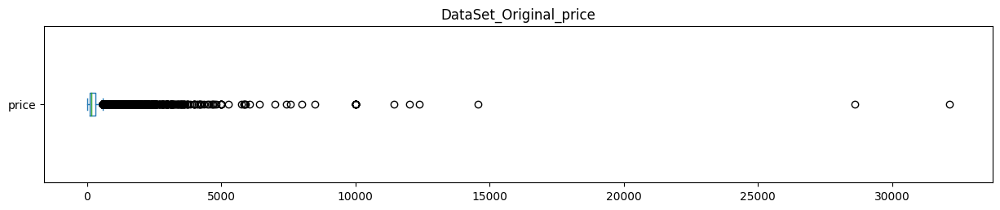

O DataSet possui 23451 colunas
com 885 entradas acima de 1,000.00,
representando 3.77% do DataSet.


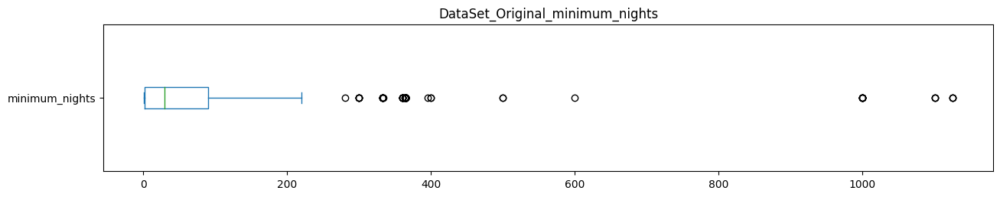

O DataSet possui 23451 colunas
com 177 entradas acima de 100 noites mínimas,
representando 0.75% do DataSet.


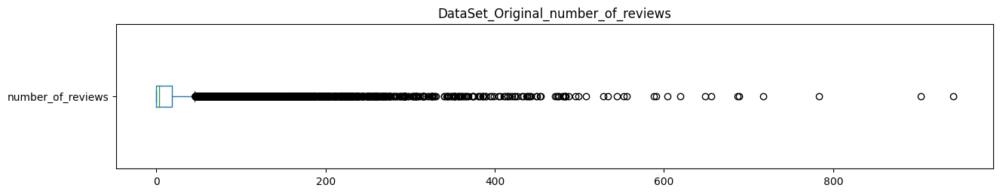

O DataSet possui 23451 colunas
com 2813 entradas acima de 50 reviews,
representando 12.00% do DataSet.


In [48]:
# BoxPlot para visualização de dados do conjunto original,
# conforme novas métricas definadas:
# Preço (price):
fig, ax = plt.subplots(figsize=(15,2.5))
df.price.plot(kind='box', vert=False);
ax.set_title('DataSet_Original_price')
plt.show()
print("O DataSet possui {} colunas".format(df.shape[0]))
print("com {} entradas acima de 1,000.00,"
    .format(len(df[df.price > 1000.00])))
print("representando {:.2f}% do DataSet."
    .format((len(df[df.price > 1000.00])/df.shape[0])*100))
# Mínimo de Noites (minimum_nights):
fig, ax = plt.subplots(figsize=(15,2.5))
df.minimum_nights.plot(kind='box', vert=False);
ax.set_title('DataSet_Original_minimum_nights')
plt.show()
print("O DataSet possui {} colunas"
    .format(df.shape[0]))
print("com {} entradas acima de 100 noites mínimas,"
    .format(len(df[df.minimum_nights > 100])))
print("representando {:.2f}% do DataSet."
    .format((len(df[df.minimum_nights > 100])/df.shape[0])*100))
# Número de Reviews (number_of_reviews):
fig, ax = plt.subplots(figsize=(15,2.5))
df.number_of_reviews.plot(kind='box', vert=False);
ax.set_title('DataSet_Original_number_of_reviews')
plt.show()
print("O DataSet possui {} colunas"
    .format(df.shape[0]))
print("com {} entradas acima de 50 reviews,"
    .format(len(df[df.number_of_reviews > 50])))
print("representando {:.2f}% do DataSet."
    .format((len(df[df.number_of_reviews > 50])/df.shape[0])*100))

O *OutLier* do número de reviews é bastante expressivo. Melhor ajustar o Limite Superior para a variável:

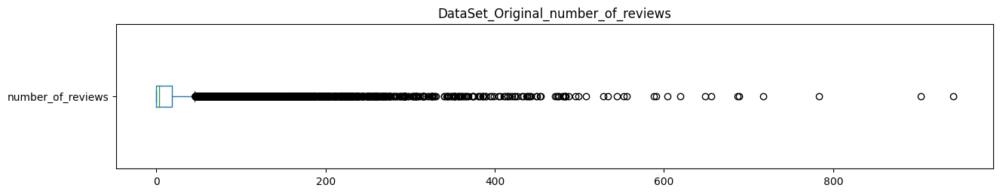

O DataSet possui 23451 colunas
com 1895 entradas acima de 75 reviews,
representando 8.08% do DataSet.


In [49]:
# Número de Reviews (number_of_reviews) > 75:
fig, ax = plt.subplots(figsize=(15,2.5))
df.number_of_reviews.plot(kind='box', vert=False);
ax.set_title('DataSet_Original_number_of_reviews')
plt.show()
print("O DataSet possui {} colunas"
    .format(df.shape[0]))
print("com {} entradas acima de 75 reviews,"
    .format(len(df[df.number_of_reviews > 75])))
print("representando {:.2f}% do DataSet."
    .format((len(df[df.number_of_reviews > 75])/df.shape[0])*100))

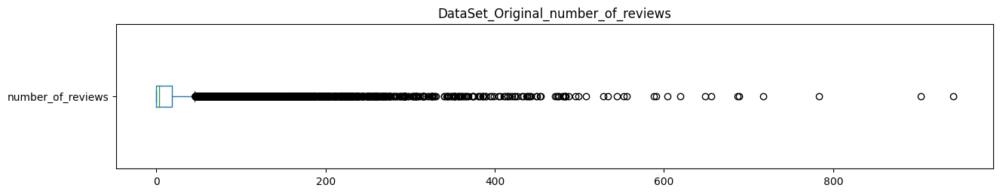

O DataSet possui 23451 colunas
com 1318 entradas acima de 100 reviews,
representando 5.62% do DataSet.


In [50]:
# Número de Reviews (number_of_reviews) > 100:
fig, ax = plt.subplots(figsize=(15,2.5))
df.number_of_reviews.plot(kind='box', vert=False);
ax.set_title('DataSet_Original_number_of_reviews')
plt.show()
print("O DataSet possui {} colunas"
    .format(df.shape[0]))
print("com {} entradas acima de 100 reviews,"
    .format(len(df[df.number_of_reviews > 100])))
print("representando {:.2f}% do DataSet."
    .format((len(df[df.number_of_reviews > 100])/df.shape[0])*100))

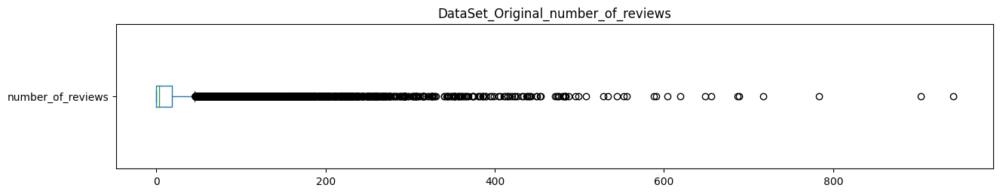

O DataSet possui 23451 colunas
com 957 entradas acima de 125 reviews,
representando 4.08% do DataSet.


In [51]:
# Número de Reviews (number_of_reviews) > 125:
fig, ax = plt.subplots(figsize=(15,2.5))
df.number_of_reviews.plot(kind='box', vert=False);
ax.set_title('DataSet_Original_number_of_reviews')
plt.show()
print("O DataSet possui {} colunas"
    .format(df.shape[0]))
print("com {} entradas acima de 125 reviews,"
    .format(len(df[df.number_of_reviews > 125])))
print("representando {:.2f}% do DataSet."
    .format((len(df[df.number_of_reviews > 125])/df.shape[0])*100))

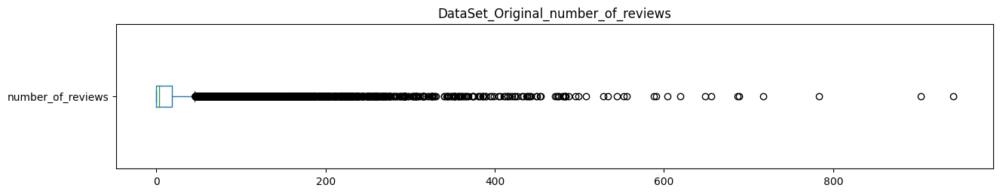

O DataSet possui 23451 colunas
com 710 entradas acima de 150 reviews,
representando 3.03% do DataSet.


In [52]:
# Número de Reviews (number_of_reviews) > 150:
fig, ax = plt.subplots(figsize=(15,2.5))
df.number_of_reviews.plot(kind='box', vert=False);
ax.set_title('DataSet_Original_number_of_reviews')
plt.show()
print("O DataSet possui {} colunas"
    .format(df.shape[0]))
print("com {} entradas acima de 150 reviews,"
    .format(len(df[df.number_of_reviews > 150])))
print("representando {:.2f}% do DataSet."
    .format((len(df[df.number_of_reviews > 150])/df.shape[0])*100))

In [53]:
# Limpando o DataSet:
df_clean = df.copy()
df_clean.drop(df_clean[df_clean.price > 1000].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.minimum_nights > 100].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.number_of_reviews > 100].index, axis=0, inplace=True)
print("Original:\t{}".format(df.shape))
print("   Agora:\t{}".format(df_clean.shape))

Original:	(23451, 18)
   Agora:	(21087, 18)


Realizada a limpeza nos dados, verificar-se-á como ficam os novos HistoGramas:

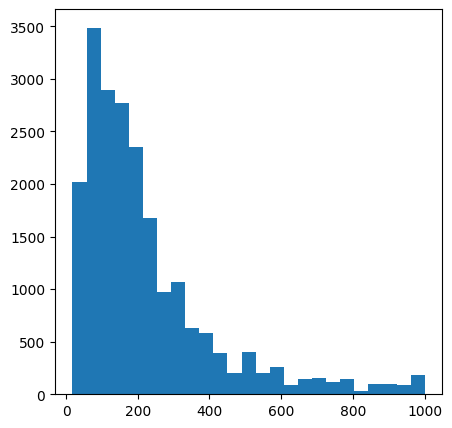

In [54]:
# Preço (price):
df_clean.price.hist(bins=25, figsize=(5,5), grid=False);

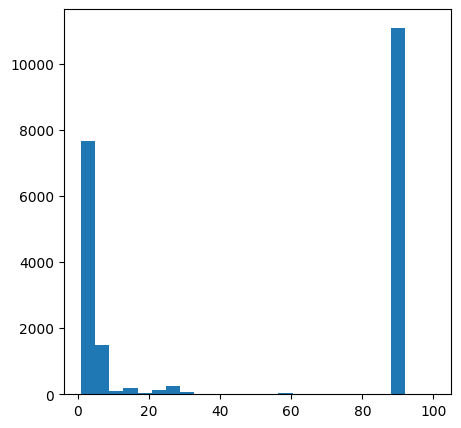

In [55]:
# Noites Mínimas (minimum_nights):
df_clean.minimum_nights.hist(bins=25, figsize=(5,5), grid=False);

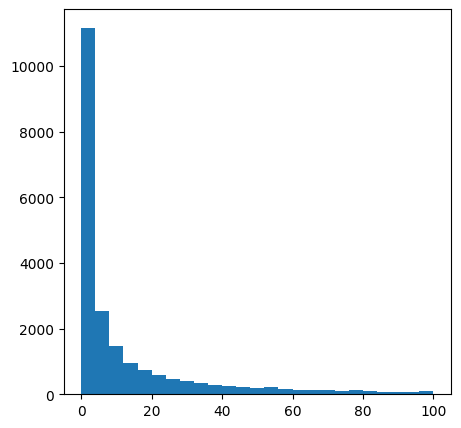

In [56]:
# Número de Reviews (number_of_reviews):
df_clean.number_of_reviews.hist(bins=25, figsize=(5,5), grid=False);

Ainda não são ideais, os *OutLiers* no mínimo de noites são bem destacados; ou os anfitriões estão buscando hóspedes de longo prazo ou estão bloqueando a acomodação por algum motivo. Necessário mais refino:

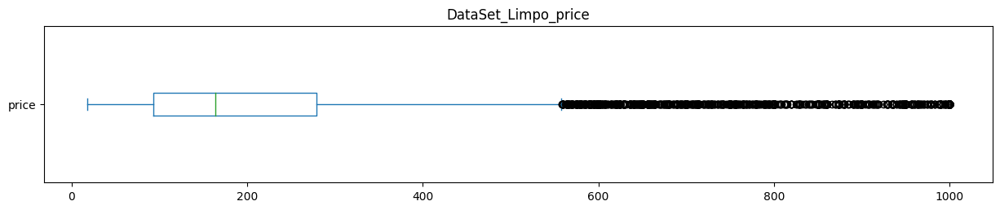

O DataSet possui 21087 colunas
com 1176 entradas acima de 600.00,
representando 5.58% do DataSet.


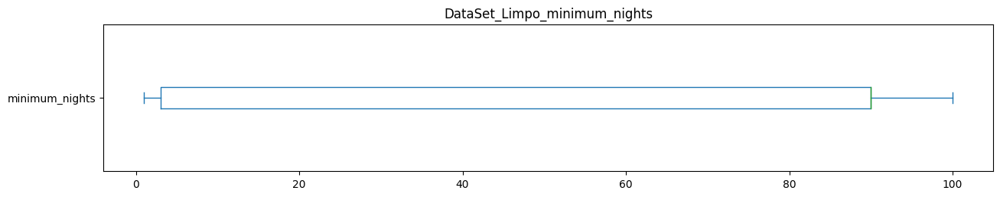

O DataSet possui 21087 colunas
com 34 entradas acima de 90 noites mínimas,
representando 0.16% do DataSet.


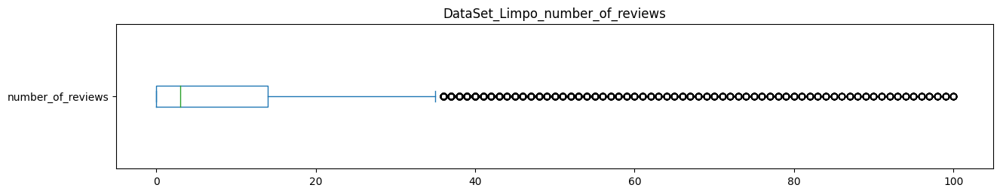

O DataSet possui 21087 colunas
com 1470 entradas acima de 50 reviews,
representando 6.27% do DataSet.


In [57]:
# BoxPlot para visualização de dados do conjunto após primeira rodada de limpeza:
# Preço (price):
fig, ax = plt.subplots(figsize=(15,2.5))
df_clean.price.plot(kind='box', vert=False);
ax.set_title('DataSet_Limpo_price')
plt.show()
print("O DataSet possui {} colunas".format(df_clean.shape[0]))
print("com {} entradas acima de 600.00,"
    .format(len(df_clean[df_clean.price > 600.00])))
print("representando {:.2f}% do DataSet."
    .format((len(df_clean[df_clean.price > 600.00])/df_clean.shape[0])*100))
# Mínimo de Noites (minimum_nights):
fig, ax = plt.subplots(figsize=(15,2.5))
df_clean.minimum_nights.plot(kind='box', vert=False);
ax.set_title('DataSet_Limpo_minimum_nights')
plt.show()
print("O DataSet possui {} colunas"
    .format(df_clean.shape[0]))
print("com {} entradas acima de 90 noites mínimas,"
    .format(len(df_clean[df_clean.minimum_nights > 90])))
print("representando {:.2f}% do DataSet."
    .format((len(df_clean[df_clean.minimum_nights > 90])/df_clean.shape[0])*100))
# Número de Reviews (number_of_reviews):
fig, ax = plt.subplots(figsize=(15,2.5))
df_clean.number_of_reviews.plot(kind='box', vert=False);
ax.set_title('DataSet_Limpo_number_of_reviews')
plt.show()
print("O DataSet possui {} colunas"
    .format(df_clean.shape[0]))
print("com {} entradas acima de 50 reviews,"
    .format(len(df_clean[df_clean.number_of_reviews > 50])))
print("representando {:.2f}% do DataSet."
    .format((len(df_clean[df_clean.number_of_reviews > 50])/df.shape[0])*100))

In [58]:
# Efetuando nova limpeza:
df_clean = df.copy()
df_clean.drop(df_clean[df_clean.price > 600].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.minimum_nights > 90].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.number_of_reviews > 50].index, axis=0, inplace=True)
print("Original:\t{}".format(df.shape))
print("   Agora:\t{}".format(df_clean.shape))

Original:	(23451, 18)
   Agora:	(18448, 18)


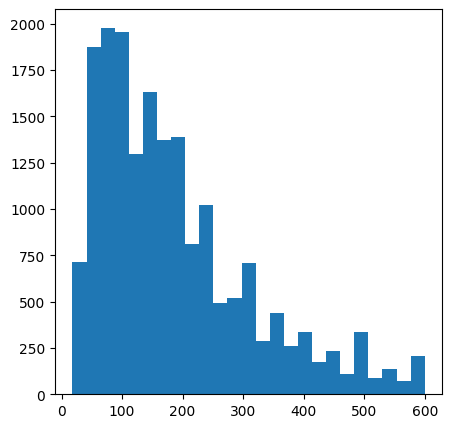

In [59]:
# Novo HistoGram - Preço (price):
df_clean.price.hist(bins=25, figsize=(5,5), grid=False);

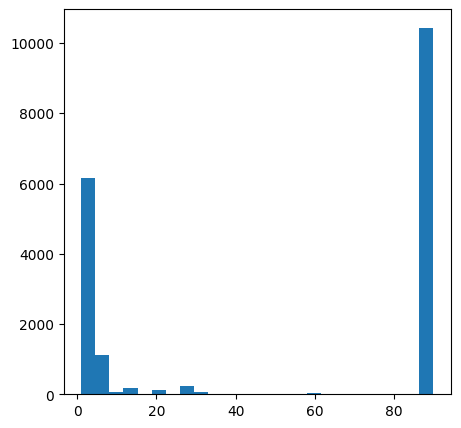

In [60]:
# Novo HistoGram - Noites Mínimas (minimum_nights):
df_clean.minimum_nights.hist(bins=25, figsize=(5,5), grid=False);

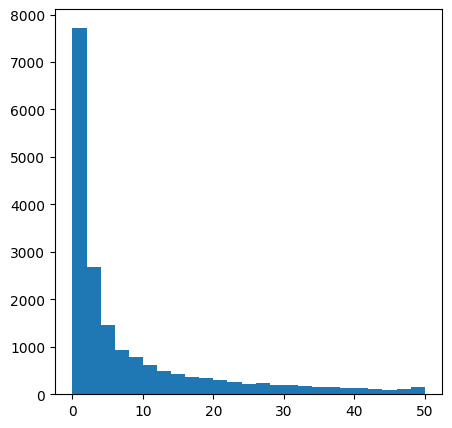

In [61]:
# Número de Reviews (number_of_reviews):
df_clean.number_of_reviews.hist(bins=25, figsize=(5,5), grid=False);

Dado o objeto analizado, difícil ficar muito melhor sem comprometer o conjunto de dados.

In [62]:
# Resumo estatístico das variáveis numéricas, pós-limpeza:
df_clean[['price',
    'minimum_nights',
    'number_of_reviews',
    'reviews_per_month',
    'calculated_host_listings_count',
    'availability_365',
    'number_of_reviews_ltm']].describe().round(2)

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,18448.00,18448.00,18448.00,13453.00,18448.00,18448.00,18448.00
mean,187.14,52.95,7.76,0.73,11.25,94.74,3.46
std,128.26,42.57,11.31,1.12,33.55,124.32,7.28
min,18.00,1.00,0.00,0.01,1.00,0.00,0.00
25%,88.00,3.00,0.00,0.05,1.00,0.00,0.00
50%,151.00,90.00,2.00,0.23,1.00,20.00,0.00
75%,250.00,90.00,10.00,0.99,3.00,167.00,3.00
max,600.00,90.00,50.00,13.58,229.00,365.00,50.00


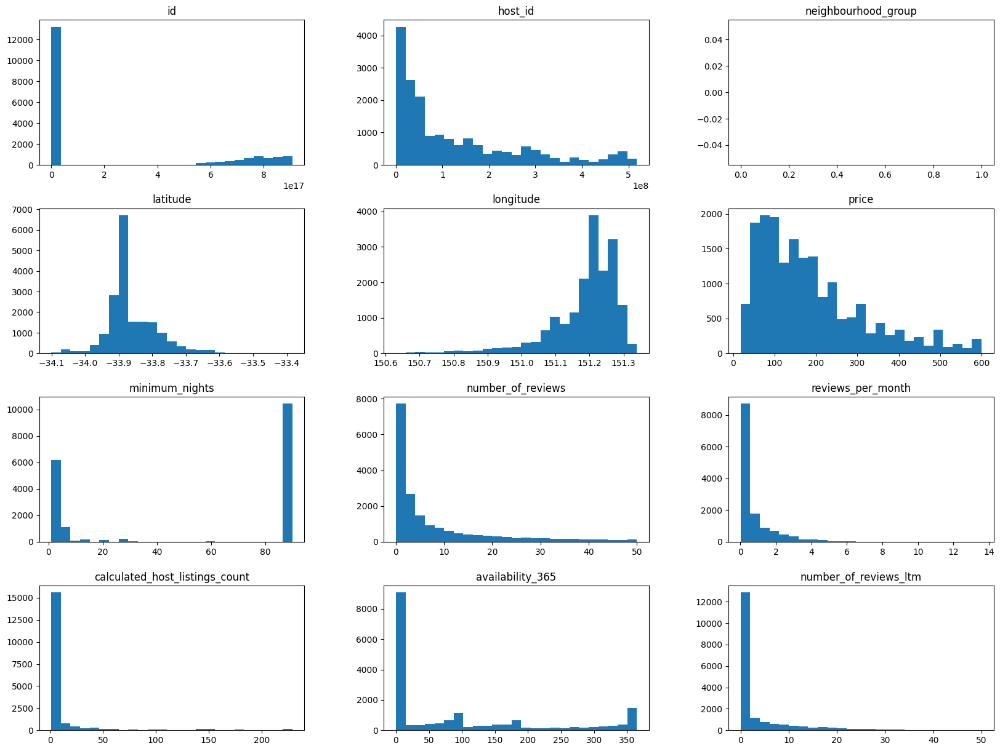

In [63]:
# Novo HistoGrama com todas as variáveis, pós-limpeza:
df_clean.hist(bins=25, figsize=(20,15), grid=False);

#### Verificando Correlação

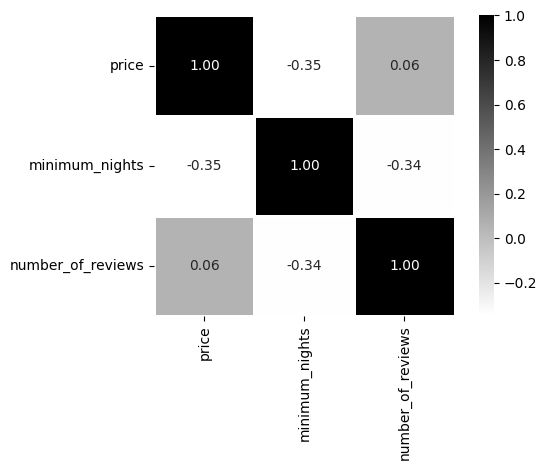

In [64]:
# Matriz de correlação:
cor = df_clean[['price',
                 'minimum_nights',
                 'number_of_reviews']].corr();
# HeatMap das correlações:
# Importando pacote necessário:
import seaborn as sns
# Configurando visualização:
sns.set_style()
ax = sns.heatmap(cor,
                 fmt= '.2f',
                 cbar= True,
                 annot= True,
                 square= True,
                 cmap= 'binary',
                 linewidths= 1,
                 linecolor= 'white')
plt.tight_layout()

Basicamente não há muita correlação positiva entre as variáveis.

### **Q4. Qual a média dos preços de aluguel?**

In [65]:
# Média da coluna 'price':
print(f'{df.price.mean():,.2f}')

289.48


####Comentário

Sydney concorre com Nova Iorque & Londres, para ficar apenas em cidades no mesmo idioma, como lugares em que o custo com hospedagem é bastante elevado, quase proibitivo, mesmo que demais gastos sejam mais medianos.

### **Q5. Qual a correlação existente entre as variáveis?**

In [66]:
# Matriz de correlação:
#Utilizando apenas variáveis numéricas, excluindo as coordenadas geográficas.
corr = df_clean[['price',
                 'minimum_nights',
                 'number_of_reviews',
                 'reviews_per_month',
                 'calculated_host_listings_count',
                 'availability_365',
                 'number_of_reviews_ltm']].corr();
display(corr)

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
price,1.000000,-0.346017,0.055620,0.130982,0.119161,0.185527,0.124733
minimum_nights,-0.346017,1.000000,-0.338544,-0.563937,-0.260697,-0.389159,-0.537701
number_of_reviews,0.055620,-0.338544,1.000000,0.419044,0.084648,0.170828,0.684922
reviews_per_month,0.130982,-0.563937,0.419044,1.000000,0.102316,0.289789,0.753533
calculated_host_listings_count,0.119161,-0.260697,0.084648,0.102316,1.000000,0.209273,0.135487
availability_365,0.185527,-0.389159,0.170828,0.289789,0.209273,1.000000,0.250023
number_of_reviews_ltm,0.124733,-0.537701,0.684922,0.753533,0.135487,0.250023,1.000000


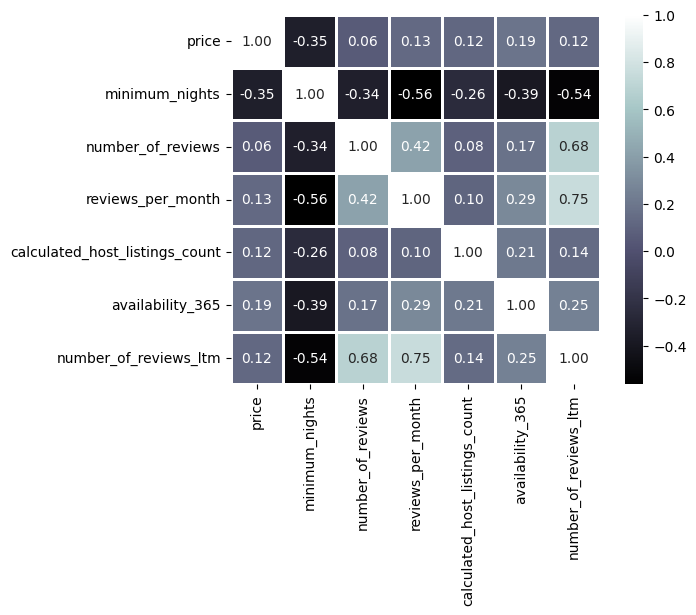

<Figure size 1500x1500 with 0 Axes>

In [67]:
# HeatMap das correlações:
# Importando pacote necessário:
import seaborn as sns
# Configurando visualização:
sns.set_style()
ax = sns.heatmap(corr,
                 fmt= '.2f',
                 cbar= True,
                 annot= True,
                 square= True,
                 cmap= 'bone',
                 linewidths= 1,
                 linecolor= 'white')
plt.figure(figsize=(15,15)).show()

#### Análise

Observa-se que as correlações entre as variáveis são pouco expressivas. Variáveis ligadas a review, evidentemente, se aproximam. Baixas correlações para dar muita segurança à ligação mais direta entre a quantidade de reviews por mês e a disponibilidade da acomodação, bem como disponibilidade da acomodação relativa ao número de acomodações (ou propriedades) do anfitrião.

**Q6. Qual o tipo de imóvel mais alugado no AirBnB nesta cidade?**

A variável `room_type` indica o tipo de locação anunciada no AirBnB, podendo ser um imóvel inteiro, apenas um quarto, ou mesmo dividir um quarto com outras pessoas.

In [68]:
# Quantidade de cada tipo de imóvel disponível:
df_clean.room_type.value_counts()

Entire home/apt    12035
Private room        6085
Shared room          267
Hotel room            61
Name: room_type, dtype: int64

In [69]:
# Percentual de cada tipo de imóvel disponível:
df_clean.room_type.value_counts()/df_clean.shape[0]

Entire home/apt    0.652374
Private room       0.329846
Shared room        0.014473
Hotel room         0.003307
Name: room_type, dtype: float64

#### Análise

Observa-se que 65% das acomodações listadas são para alugar todo o imóvel, ficando o restante basicamente com quartos privados. Quartos para dividir com outras pessoas e quartos de hotel, o que parece ser uma nova categoria introduzida pelo AirBnB, são desprezíveis nesta amostra de dados.

### **Q7. Qual a localidade mais cara do *DataSet*?**



Uma maneira de se verificar uma variável em função de outra é usar `.groupby()`; no caso, quer-se comparar os bairros (*neighbourhoods*) a partir do preço de locação.

In [70]:
# Média de preços por bairro:
df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=False)[:10]

neighbourhood
Pittwater           313.123853
Manly               258.029448
Mosman              256.669951
Warringah           235.373247
Sutherland Shire    233.242812
Woollahra           213.920821
Leichhardt          207.434884
North Sydney        205.902235
Waverley            203.722756
Hunters Hill        197.680000
Name: price, dtype: float64

#### Comentário

Curiosamente, as regiões com as médias de valores mais elevados não são próximas ao centro da cidade. Lembrando que essa é a média de preços já limpos, tendo-se removido valores muito extremados.

In [71]:
# Como seria com Mediana:
df_clean.groupby(['neighbourhood']).price.median().sort_values(ascending=False)[:10]

neighbourhood
Pittwater           300.0
Manly               238.0
Mosman              225.0
Warringah           200.0
Sutherland Shire    190.0
Leichhardt          180.0
Hunters Hill        180.0
Woollahra           180.0
Waverley            176.0
North Sydney        175.0
Name: price, dtype: float64

Pouca mudança na distribuição, apenas North Sydney poderia ser considerada uma região mais central.

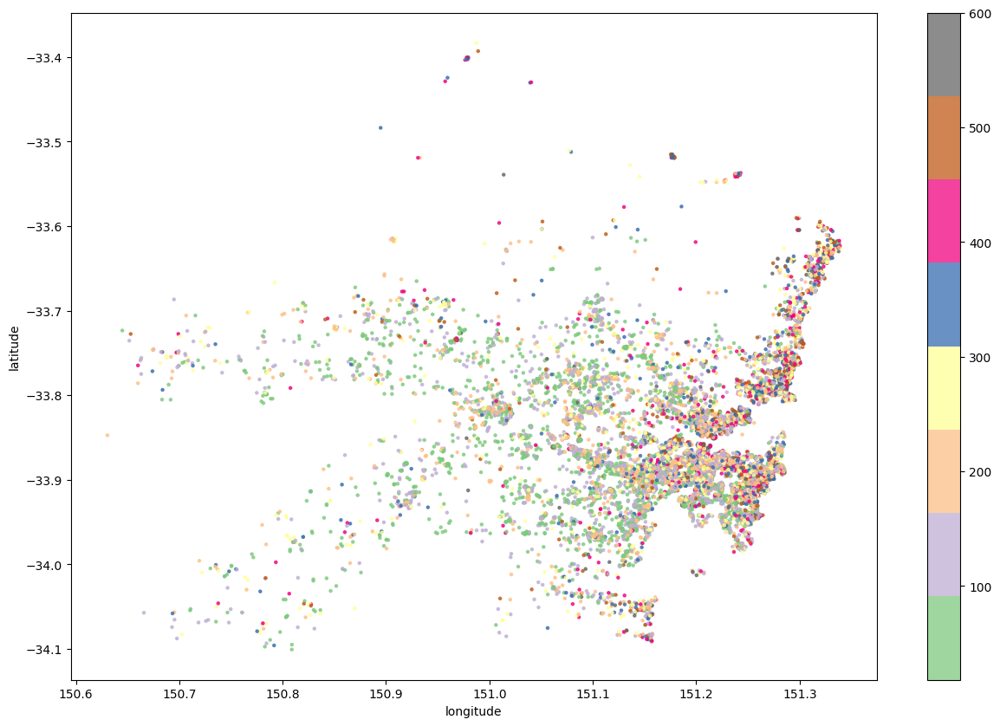

In [72]:
# @title Distribuição Geográfica
# Plotando imóveis por latitude-longitude:
df_clean.plot(kind="scatter",
              x='longitude',
              y='latitude',
              alpha=0.75,
              c=df_clean['price'],
              s=5,
              cmap=plt.get_cmap('Accent'),
              figsize=(15,10));

Bairros que aparecem como mais caros do que os que seriam mais esperados parece ocorrer por conterem poucas listagens em relação a localidades mais demandadas e que possuem maior oferta de acomodação, como se verifica na distribuição geográfica.

In [73]:
# Quantidade de anúncios por bairros:
df_clean.neighbourhood.value_counts()

Sydney              4081
Waverley            2395
Randwick            1579
Warringah            927
Manly                815
North Sydney         716
Woollahra            682
Marrickville         585
Pittwater            436
Leichhardt           430
Ryde                 408
Rockdale             378
Auburn               364
Parramatta           348
Botany Bay           347
Sutherland Shire     313
Canada Bay           308
Willoughby           298
Hornsby              280
The Hills Shire      239
Ku-Ring-Gai          233
Canterbury           224
Blacktown            215
Burwood              214
Mosman               203
Ashfield             182
Lane Cove            162
Bankstown            139
Liverpool            127
Strathfield          124
City Of Kogarah      123
Hurstville           122
Fairfield            116
Penrith              110
Campbelltown          73
Holroyd               68
Camden                59
Hunters Hill          25
Name: neighbourhood, dtype: int64

In [74]:
# Em percentual:
df_clean.neighbourhood.value_counts()/df_clean.shape[0]

Sydney              0.221216
Waverley            0.129824
Randwick            0.085592
Warringah           0.050249
Manly               0.044178
North Sydney        0.038812
Woollahra           0.036969
Marrickville        0.031711
Pittwater           0.023634
Leichhardt          0.023309
Ryde                0.022116
Rockdale            0.020490
Auburn              0.019731
Parramatta          0.018864
Botany Bay          0.018810
Sutherland Shire    0.016967
Canada Bay          0.016696
Willoughby          0.016154
Hornsby             0.015178
The Hills Shire     0.012955
Ku-Ring-Gai         0.012630
Canterbury          0.012142
Blacktown           0.011654
Burwood             0.011600
Mosman              0.011004
Ashfield            0.009866
Lane Cove           0.008781
Bankstown           0.007535
Liverpool           0.006884
Strathfield         0.006722
City Of Kogarah     0.006667
Hurstville          0.006613
Fairfield           0.006288
Penrith             0.005963
Campbelltown  

Confirma-se que a localidade de Sydney, propriamente dita, que é o centro da cidade, concentra mais de 22% das ofertas de hospedagem, juntamente com as localidades de Waverley & RandWick, localizadas a leste de Sydney, junto à famosa praia de *Bondi*, e que, somadas, quase empatam com Sydney em número de listagem de hospedagens. As três localidades somadas já perfazem mais de 40% do total. Se somadas ao 4º & 5º lugar, Warringah, nas praias do norte, e Manly, principal praia de Sydney depois de *Bondi*, os cinco primeiros lugares já são metade da oferta de hospedagem deste banco de dados para Sydney, ficando os demais 50% divididos em mais de 30 localidades, resultando nas porcentagens pouco representativas que se viu, bem como na distorção de preços que os fazem figurar no topo quando se puxa os dados pela localidade mais cara. Essas regiões de subúrbio possuem casas maiores e mais espaçosas, com muitos cômodos, permitindo hospedar muitas pessoas, o que, obviamente, reflete no preço, com, às vezes, uma única listagem sendo superior à miríade de acomodações menores do centro da cidade.

### **Q8. Qual é a média do mínimo de noites para aluguel (minimum_nights)?**

In [75]:
# Média da coluna 'minimum_nights:
print(f'{df.minimum_nights.mean():,.1f}')

48.5


#### Comentário

Média elevada, ou os anfitriões estão buscando locações de longo prazo - quase dois mês; ou estão utilizando esse recurso para "bloquear" as acomodações por alguma razão.

In [76]:
# Verificando a mediana:
print(f'{df.minimum_nights.median():,.1f}')

30.0


Um mês, realmente valores bem elevados para quantidade mínima de noites. Geralmente esses valores são bem menores, para contemplar hospedagens de fim de semana, por exemplo. Pouco usual para esse tipo de objeto.

## Conclusões

Realizada uma primeira análise na base de dados resumida do AirBnB, foi possível completar os dados ausentes com 100% de aproveitamento da base, sem necessidade de exclusão de entradas.

Não obstante, o conjunto de dados se mostrou desafiador, com presença de *OutLiers* significativos nas variáveis, sobretudo na variável noites mínimas, o que é surpreendente considerando o objeto acomodação temporária. Além disso, *OutLiers* distorcem as métricas estatísticas, com poucos valores contribuindo para elevar médias, deixando-as muito afastadas de suas respectivas medianas, consequentemente aumentando o desvio-padrão.

Durante o processo de limpeza dos dados, buscou-se apoio em métricas quantitativas & qualitativas (para compensar eventuais distorções), ainda assim, presou-se por manter a maior integralidade da base de dados possível, rodando diversos cenários, buscando-se apenas aparar as pontas mais extremadas.

Os dados comprovam que Sydney é uma cidade com custo de alojamento elevado, com forte predileção dos anfitirões por hóspedes para longa estada: apenas o primeiro quartil (Q1) tem mínimo de duas noites, sendo que o Q2 (mediana) já chega em trinta noites, isto é, um mês. Dessa forma, 50% das entradas listadas possuem mínimo de noites superior a um mês, sendo a maior concentração desses valores próximo a três meses, algo pouco usual para esse tipo de objeto. Um fator exógeno aos dados é que, em algumas localidades, podem vigorar políticas habitacionais restritivas a aluguéis de curta duração para proteger o mercado habitacional local e seus residentes, evitando que imóveis sejam adquiridos apenas para serem disponibilizados para aluguéis de curta duração, redusindo a oferta de residências para uso como tal pelas pessoas e famílias e, por conseguinte, inflacionando o mercado imobiliários, impedido o acesso de ainda mais pessoas à moradia.

A dispersão geográfica das opções de acomodação também podem gerar, a primeira vista, distorções sobre quais localidades seriam as mais caras pois, muitas vezes, uma ou poucas opções, em bairros mais afastados do centro e, portanto com mais espaço e propriedades maiores, tornam-se *OutLiers* no conjunto de dados, uma vez que, em regiões centrais, maior concentração de opções de acomodação acaba refletindo na redução da média dos preços, dado que alguns "poucos" lugares mais caros são diluídos por inúmeras outras opções, geralmente menores e menos luxuosas, mas, consequentemente, mais em conta.

Esta é uma abordagem inicial, a partir de um *DataSet* resumido. Para uma próxima análise exploratória mais aprofundada, seria interessante utilizar o conjunto de dados completos, com mais entradas & atributos disponíveis.

Outra observação final importante: como os dados parecem abarcar apenas os últimos 365 dias, metade desse período ainda engloba o ano anterior, período em que ainda havia maior preocupação com a pandemia de COVID-19, o que também poderia explicar esses períodos mais longos de noites mínimas, além do já aventado.

Conclui-se a análise dos dados do AirBnB para Sydney com o Profiling Report.

In [77]:
# @title Pandas Profiling Report
# Instalando e importanto recursos necessários:
!pip install --upgrade pip
!pip install --upgrade pandas_profiling
!pip install --upgrade pillow
from pandas_profiling import ProfileReport
# Criando ProfileReport:
report = ProfileReport(df_clean)
# Exportando HTML:
report.to_file("SydneyAirBnB.html")
# Visualização:
report.to_notebook_iframe()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 24.7 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.8 MB/s eta 0:00:00
  Obtaining dependency information for ydata-profiling from https://files.pythonhosted.org/packages/07/ba/f229e94517d033b427b3e856e1429872ce8368601ef534cad3c14a40f99e/ydata_profiling-4.3.1-py2.py3-none-any.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 25.9 MB/s eta 0:00:00
  Obtaining dependency information for wordcloud>=1.9.1 from https://files.pythonhosted.org/packages/22/0d/bb4eccd60d272b33cbc79c661c60acc604f1688cfc922deb9d3eb5be640a/wordcloud-1.9.2-cp310-cp31

<ipython-input-77-80953c8eb181>:6: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]